The point of this notebook is to do a quick prediction on some sample images with a pretrained network.

In [1]:
import sys

In [2]:
sys.path.append('../')

In [3]:
import cPickle as pickle
import re
import glob
import os

import time

import theano
import theano.tensor as T
import numpy as np
import pandas as p
import lasagne as nn

from utils import hms, architecture_string, get_img_ids_from_iter

Using gpu device 0: GeForce GTX 970 (CNMeM is enabled with initial size: 70.0% of memory, cuDNN 4007)
/home/sidharth/anaconda2/lib/python2.7/site-packages/theano/tensor/signal/downsample.py:6: UserWarning: downsample module has been moved to the theano.tensor.signal.pool module.
  "downsample module has been moved to the theano.tensor.signal.pool module.")


In [4]:
%pylab inline

rcParams['figure.figsize'] = 16, 6
# rcParams['text.color'] = 'red'
# rcParams['xtick.color'] = 'red'
# rcParams['ytick.color'] = 'red'

Populating the interactive namespace from numpy and matplotlib


In [5]:
np.set_printoptions(precision=3)
np.set_printoptions(suppress=True)

First we load the dump of the trained network.

In [6]:
dump_path = '../dumps/2015_07_17_123003.pkl'

In [7]:
model_data = pickle.load(open(dump_path, 'r'))

In [8]:
# Let's set the in and output layers to some local vars.
l_out = model_data['l_out']
l_ins = model_data['l_ins']

Some info about the architecture of the model:

In [9]:
nn.layers.get_all_layers(model_data['l_out'])

In [15]:
64 //2

32

In [16]:
model_arch = architecture_string(model_data['l_out'])

num_params = nn.layers.count_params(l_out)
model_arch += "\nNumber of parameters: %d.\n\n" % num_params

# Get some training/validation info.
selected_keys = ['acc_eval_train', 'acc_eval_valid',
                 'losses_eval_train', 'losses_eval_valid',
                 'metric_eval_train', 'metric_eval_valid',
                 'metric_cont_eval_train', 'metric_cont_eval_valid']
model_metrics = {key: model_data[key]
                 for key in selected_keys if key in model_data}

res_df = p.DataFrame(model_metrics)

model_arch += 'BEST/LAST KAPPA TRAIN: %.3f - %.3f.\n' % (
    res_df.metric_eval_train.max(),
    res_df.metric_eval_train.iloc[-1]
)
model_arch += 'BEST/LAST KAPPA VALID: %.3f - %.3f.\n' % (
    res_df.metric_eval_valid.max(),
    res_df.metric_eval_valid.iloc[-1]
)

model_arch += '\nBEST/LAST ACC TRAIN: %.2f - %.2f.\n' % (
    res_df.acc_eval_train.max() * 100,
    res_df.acc_eval_train.iloc[-1] * 100
)

model_arch += 'BEST/LAST ACC VALID: %.2f - %.2f.\n' % (
    res_df.acc_eval_valid.max() * 100,
    res_df.acc_eval_valid.iloc[-1] * 100
)

model_arch += '\nTOTAL TRAINING TIME: %s' % \
              hms(model_data['time_since_start'])

print model_arch

   0  InputLayer                   (64, 3, 512, 512)  
   1  Conv2DDNNLayer               (64, 32, 256, 256)  7 //2
   2  MaxPool2DDNNLayer            (64, 32, 127, 127)  3 //2
   3  Conv2DDNNLayer               (64, 32, 127, 127)  3 //1
   4  Conv2DDNNLayer               (64, 32, 127, 127)  3 //1
   5  MaxPool2DDNNLayer            (64, 32, 63, 63)  3 //2
   6  Conv2DDNNLayer               (64, 64, 63, 63)  3 //1
   7  Conv2DDNNLayer               (64, 64, 63, 63)  3 //1
   8  MaxPool2DDNNLayer            (64, 64, 31, 31)  3 //2
   9  Conv2DDNNLayer               (64, 128, 31, 31)  3 //1
  10  Conv2DDNNLayer               (64, 128, 31, 31)  3 //1
  11  Conv2DDNNLayer               (64, 128, 31, 31)  3 //1
  12  Conv2DDNNLayer               (64, 128, 31, 31)  3 //1
  13  MaxPool2DDNNLayer            (64, 128, 15, 15)  3 //2
  14  Conv2DDNNLayer               (64, 256, 15, 15)  3 //1
  15  Conv2DDNNLayer               (64, 256, 15, 15)  3 //1
  16  Conv2DDNNLayer               (64, 256, 

*Note:* very long training time (80 hours!) is because of the (slow) AWS GPU and something special in the generator process which I only added at the end (the extra width cropping). You can get similar performance in (less than) 1 day with a GTX 980.

*Extra note:* if you have read my [blog post](http://jeffreydf.github.io/diabetic-retinopathy-detection/) you might notice the accuracy being much higher here than at the model image at the end (around 84% vs 80%). This is not (really) because this model is better but because this model used a lower *y_pow* (namely, *y_pow=1*). *y_pow* specifies to which power to raise the predictions before calculating the loss (see losses.py) and higher *y_pow* (mostly *y_pow=2*) gives much lower accuracy (around 80%) but used to give higher kappa scores. In the end they seemed to give similar kappa scores.

Some more kappa specific metrics:

In [32]:
train_conf_mat, hist_rater_a, \
        hist_rater_b, train_nom, \
        train_denom = model_data['metric_extra_eval_train'][-1]

In [33]:
valid_conf_mat, hist_rater_a, \
        hist_rater_b, valid_nom, \
        valid_denom = model_data['metric_extra_eval_valid'][-1]

In [34]:
# Normalised train confusion matrix (with argmax decoding).
print train_conf_mat / train_conf_mat.sum()

[[ 0.715  0.04   0.027  0.     0.   ]
 [ 0.014  0.016  0.008  0.     0.   ]
 [ 0.011  0.016  0.078  0.002  0.001]
 [ 0.     0.     0.03   0.02   0.001]
 [ 0.     0.     0.003  0.001  0.016]]


In [35]:
# Normalised validation confusion matrix (with argmax decoding).
print valid_conf_mat / valid_conf_mat.sum()

[[ 0.704  0.042  0.028  0.001  0.001]
 [ 0.011  0.016  0.008  0.     0.   ]
 [ 0.015  0.013  0.085  0.005  0.003]
 [ 0.     0.     0.029  0.017  0.004]
 [ 0.001  0.     0.003  0.002  0.014]]


Setting up some Theano / Lasagne things to get some predictions.

In [36]:
chunk_size = model_data['chunk_size'] * 2
batch_size = model_data['batch_size']

print "Batch size: %i." % batch_size
print "Chunk size: %i." % chunk_size

Batch size: 64.
Chunk size: 256.


In [37]:
output = nn.layers.get_output(l_out, deterministic=True)
input_ndims = [len(nn.layers.get_output_shape(l_in))
               for l_in in l_ins]
xs_shared = [nn.utils.shared_empty(dim=ndim)
             for ndim in input_ndims]
idx = T.lscalar('idx')

givens = {}
for l_in, x_shared in zip(l_ins, xs_shared):
    givens[l_in.input_var] = x_shared[idx * batch_size:(idx + 1) * batch_size]

compute_output = theano.function(
    [idx],
    output,
    givens=givens,
    on_unused_input='ignore'
)

In [38]:
# Do transformations per patient instead?
if 'paired_transfos' in model_data:
    paired_transfos = model_data['paired_transfos']
else:
    paired_transfos = False
    
print paired_transfos

True


We're going to test on some train images, so loading the training set labels.

In [39]:
train_labels = p.read_csv('../data/new_trainLabels.csv')

In [42]:
print train_labels.head(20)

          image  level
0     1000_left      0
1    1000_right      0
2    10003_left      0
3   10003_right      0
4    10007_left      0
5   10007_right      0
6    10009_left      0
7   10009_right      0
8    10010_left      0
9   10010_right      0
10      15_left      1
11     15_right      2
12      16_left      4
13     16_right      4


In [43]:
# Get all patient ids.
patient_ids = sorted(set(get_img_ids_from_iter(train_labels.image)))

In [44]:
num_chunks = int(np.ceil((2 * len(patient_ids)) / float(chunk_size)))

In [45]:
# Where all the images are located: 
# it looks for [img_dir]/[patient_id]_[left or right].jpeg
img_dir = '/home/sidharth/dev/Diabetic Retinopathy/resized/'

Using the DataLoader to set up the parameters, you could replace it with something much simpler.

In [46]:
from generators import DataLoader

In [47]:
data_loader = DataLoader()
new_dataloader_params = model_data['data_loader_params']
new_dataloader_params.update({'images_test': patient_ids})
new_dataloader_params.update({'labels_test': train_labels.level.values})
new_dataloader_params.update({'prefix_train': img_dir})
data_loader.set_params(new_dataloader_params)

The next function is going to iterate over a test generator to get the outputs.

In [48]:
def do_pred(test_gen):
    outputs = []

    for e, (xs_chunk, chunk_shape, chunk_length) in enumerate(test_gen()):
        num_batches_chunk = int(np.ceil(chunk_length / float(batch_size)))

        print "Chunk %i/%i" % (e + 1, num_chunks)

        print "  load data onto GPU"
        for x_shared, x_chunk in zip(xs_shared, xs_chunk):
            x_shared.set_value(x_chunk)

        print "  compute output in batches"
        outputs_chunk = []
        for b in xrange(num_batches_chunk):
            out = compute_output(b)
            outputs_chunk.append(out)

        outputs_chunk = np.vstack(outputs_chunk)
        outputs_chunk = outputs_chunk[:chunk_length]

        outputs.append(outputs_chunk)

    return np.vstack(outputs), xs_chunk

We get the default "no transformation" parameters for the model.

In [49]:
no_transfo_params = model_data['data_loader_params']['no_transfo_params']

print no_transfo_params

{'extra_width_crop': True, 'rotation_before_resize': False, 'crop_height': False, 'resize_pad': False, 'keep_aspect_ratio': False}


And set up the test generator on the first 256 patients of the training set (512 images).

In [50]:
# The default gen with "no transfos".
test_gen = lambda: data_loader.create_fixed_gen(
    data_loader.images_test[:128*2],
    chunk_size=chunk_size,
    prefix_train=img_dir,
    prefix_test=img_dir,
    transfo_params=no_transfo_params,
    paired_transfos=paired_transfos,
)

Then we can get some predictions.

In [51]:
%%time
outputs_orig, chunk_orig = do_pred(test_gen)

Chunk 1/1
  load data onto GPU
  compute output in batches
CPU times: user 500 ms, sys: 500 ms, total: 1e+03 ms
Wall time: 993 ms


Explore some of the predictions.

In [52]:
from metrics import continuous_kappa

In [55]:
patient_ids

[15, 16, 1000, 10003, 10007, 10009, 10010]

In [54]:
outputs_orig

array([[ 0.953,  0.042,  0.005,  0.   ,  0.   ],
       [ 0.922,  0.059,  0.018,  0.001,  0.   ],
       [ 0.   ,  0.   ,  0.   ,  0.008,  0.991],
       [ 0.   ,  0.   ,  0.   ,  0.024,  0.976],
       [ 0.97 ,  0.025,  0.005,  0.   ,  0.   ],
       [ 0.973,  0.023,  0.004,  0.   ,  0.   ],
       [ 0.781,  0.201,  0.017,  0.   ,  0.   ],
       [ 0.807,  0.181,  0.012,  0.   ,  0.   ],
       [ 0.969,  0.028,  0.003,  0.   ,  0.   ],
       [ 0.958,  0.038,  0.003,  0.   ,  0.   ],
       [ 0.95 ,  0.043,  0.007,  0.001,  0.   ],
       [ 0.929,  0.062,  0.008,  0.001,  0.   ],
       [ 0.955,  0.036,  0.008,  0.001,  0.   ],
       [ 0.945,  0.043,  0.01 ,  0.001,  0.   ]], dtype=float32)

In [53]:
outputs_labels = np.argmax(outputs_orig, axis=1)

kappa_eval = continuous_kappa(
                outputs_labels,
                train_labels.level.values[:outputs_labels.shape[0]],
            )

metric, conf_mat, \
    hist_rater_a, hist_rater_b, \
    nom, denom = kappa_eval
    
print 'Kappa %.4f' % metric, '\n'
print conf_mat, '\n'
print nom, '\n'
print nom / nom.sum(), nom.sum()

Kappa -0.2228 

[[8 1 1 0 2]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]] 

[[ 0.     0.062  0.25   0.     2.   ]
 [ 0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.   ]
 [ 2.     0.     0.     0.     0.   ]] 

[[ 0.     0.014  0.058  0.     0.464]
 [ 0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.   ]
 [ 0.464  0.     0.     0.     0.   ]] 4.3125


Bit high of a kappa but this is because: 

1. There is a gap between the train and validation kappa.
2. This is a small sample.

Let's discriminate between train / validation.

In [31]:
train_imgs = set(data_loader.images_train_0)
valid_idx = [0  if img in train_imgs else 1 for img in data_loader.images_test]

In [32]:
df_preds = p.DataFrame([train_labels.image[:outputs_labels.shape[0]],
                        outputs_labels,
                        train_labels.level.values[:outputs_labels.shape[0]],
                       np.repeat(valid_idx, 2)[:outputs_labels.shape[0]]]).T
df_preds.columns = ['image', 'pred', 'true', 'valid']

The misclassifications:

In [33]:
df_preds[df_preds.pred != df_preds.true]

,image,pred,true,valid
4,15_left,0,1,0
5,15_right,0,2,0
9,17_right,0,1,0
22,30_left,0,1,0
23,30_right,0,2,0
28,36_left,0,1,0
30,40_left,1,2,0
31,40_right,1,0,0
43,51_right,1,0,0
78,78_left,0,2,0


Let's look at some sample activations:

In [34]:
diag_out = theano.function(
    [idx],
    nn.layers.get_output(nn.layers.get_all_layers(l_out), deterministic=True),
    givens=givens,
    on_unused_input="ignore"
)

In [35]:
diag_result = np.asarray(diag_out(0))

In [36]:
# The input images.
diag_result[0].shape

(64, 3, 512, 512)

In [37]:
def plot_rollaxis(im, figsize=(15, 15), 
                  zmuv_mean=data_loader.zmuv_mean, 
                  zmuv_std=data_loader.zmuv_std,
                 norm=True, ax=None):
    if not ax:
        fig, ax = plt.subplots(1, figsize=figsize)
        
    if norm:
        ax.imshow((zmuv_std[0] + 0.05) * np.rollaxis(im, 0, 3) + zmuv_mean[0])
    else:
        ax.imshow(np.rollaxis(im, 0, 3))
        
    return ax

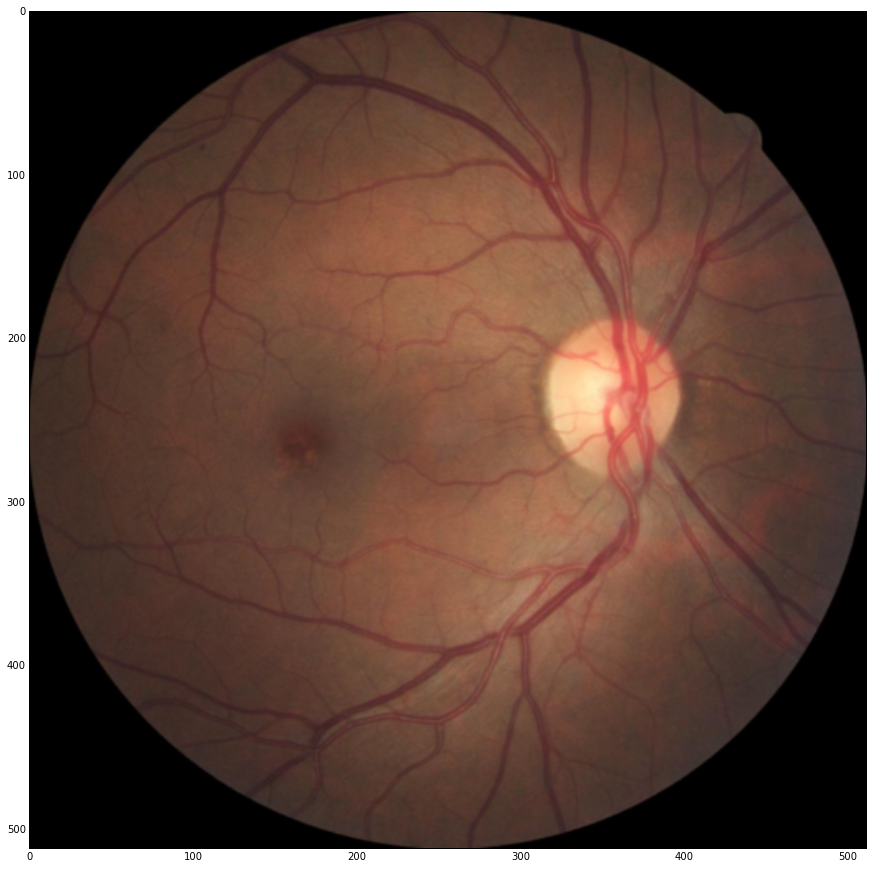

In [38]:
plot_rollaxis(diag_result[0][1])

Do keep in mind, we work in "chunks" and only the last "chunk" is still loaded on the GPU.

Since a chunk is 256 images, we can subset those predictions.

In [39]:
df_chunk = df_preds[-128*2:]
df_chunk['idx'] = np.repeat(range(128), 2)

print df_chunk

         image pred true valid  idx
256   301_left    0    0     0    0
257  301_right    0    1     0    0
258   307_left    0    0     0    1
259  307_right    0    0     0    1
260   310_left    0    0     0    2
261  310_right    0    0     0    2
262   311_left    0    0     1    3
263  311_right    0    0     1    3
264   314_left    0    0     1    4
265  314_right    0    0     1    4
266   316_left    0    0     0    5
267  316_right    0    0     0    5
268   317_left    2    2     0    6
269  317_right    2    2     0    6
270   318_left    0    0     0    7
271  318_right    0    0     0    7
272   320_left    2    1     0    8
273  320_right    2    2     0    8
274   322_left    1    0     0    9
275  322_right    0    0     0    9
276   323_left    0    0     0   10
277  323_right    0    0     0   10
278   325_left    0    2     0   11
279  325_right    0    2     0   11
280   326_left    4    4     0   12
281  326_right    4    4     0   12
282   328_left    2    2    

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from IPython.kernel.zmq import kernelapp as app


In [40]:
# To print some output for a layer. (Hacky / quick.)
def print_output(layer_out, norm=False):
    fig, ax = plt.subplots(1, 2, sharey=True, figsize=(15, 200))

    for i, elem in enumerate(np.asarray(layer_out)[:2]):
        print elem.shape
        
        if norm:
            ax[i].imshow(np.concatenate(elem, axis=0), cmap=plt.cm.gray, 
                         vmin=np.asarray(layer_out).min(),
                         vmax=np.asarray(layer_out).max())
        else:        
            ax[i].imshow(np.concatenate(elem, axis=0), cmap=plt.cm.gray)

So, if we take index 8, we should see:

In [41]:
idx = 8

In [42]:
df_chunk[df_chunk.idx == idx]

,image,pred,true,valid,idx
272,320_left,2,1,0,8
273,320_right,2,2,0,8


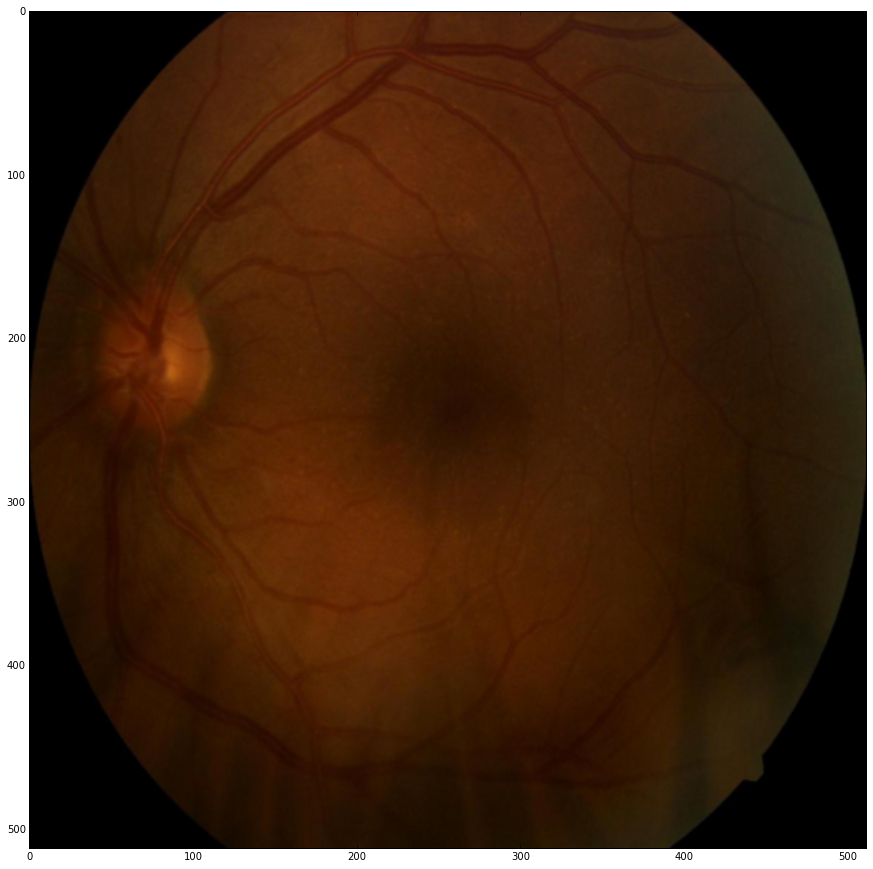

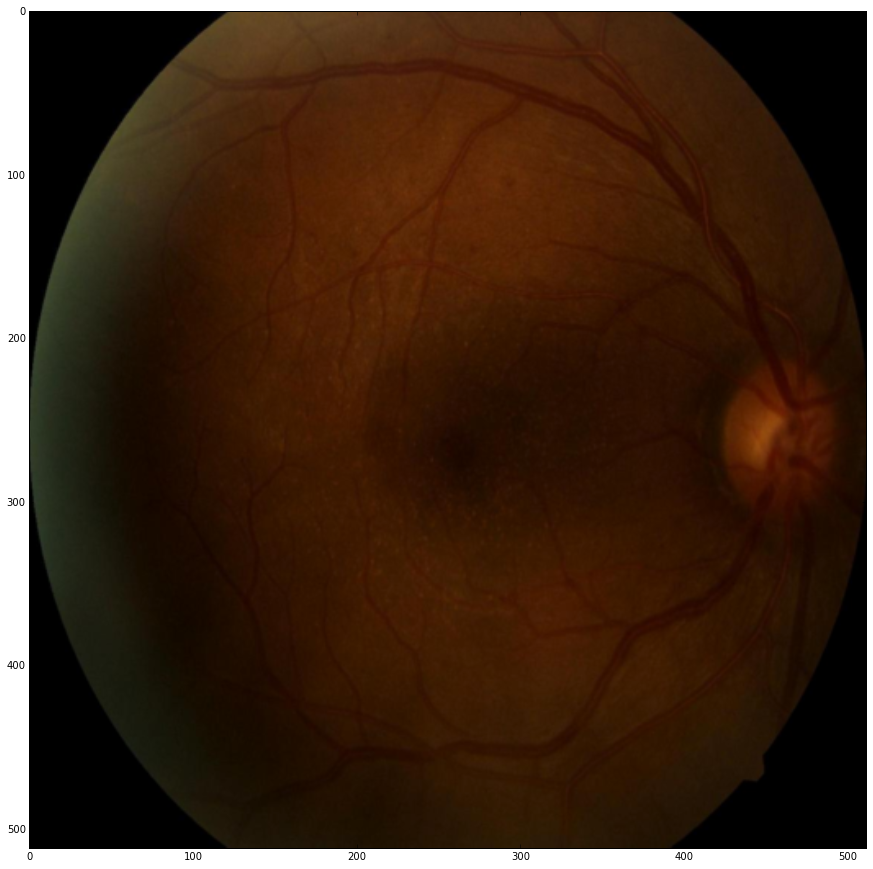

In [43]:
plot_rollaxis(diag_result[0][2*idx+0])  # Left.
plot_rollaxis(diag_result[0][2*idx+1])  # Right.

Let's see the output of one filter of the first layer for the left eye of that patient:

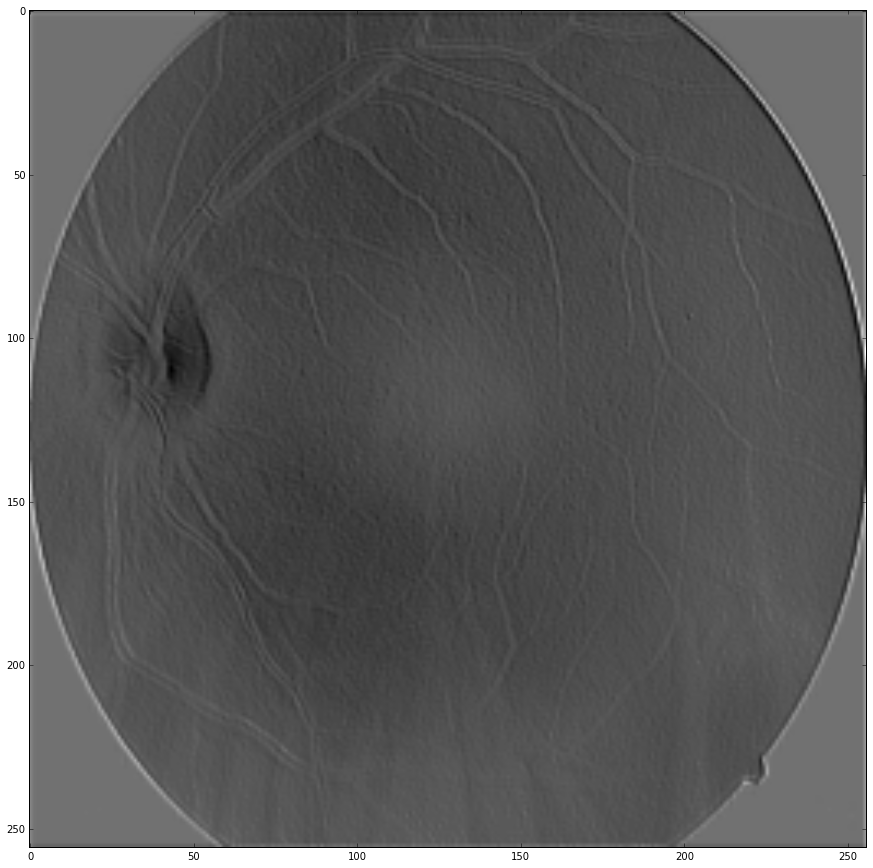

In [44]:
fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(diag_result[1][2*idx+0][24], cmap=plt.cm.gray)

If you do this for some images with microaneurysms, most of the time you will see them getting "detected".

You can then also follow this "detection" through the following layers.

To get the activations for both eyes for a certain layer, we can do:

(32, 127, 127)
(32, 127, 127)


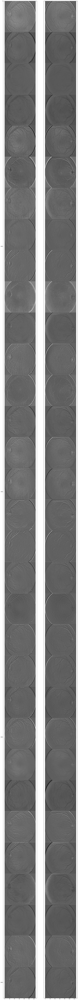

In [45]:
print_output(diag_result[4][2*idx:], norm=False)

Another one:

In [46]:
idx = 13

In [47]:
df_chunk[df_chunk.idx == idx]

,image,pred,true,valid,idx
282,328_left,2,2,0,13
283,328_right,3,3,0,13


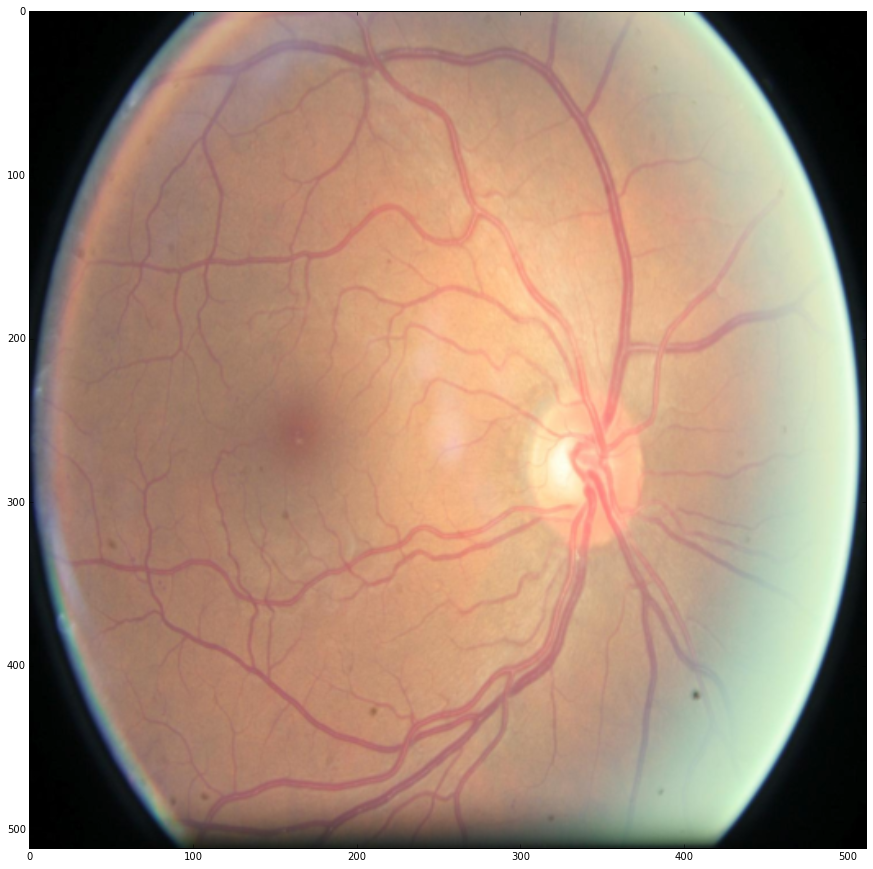

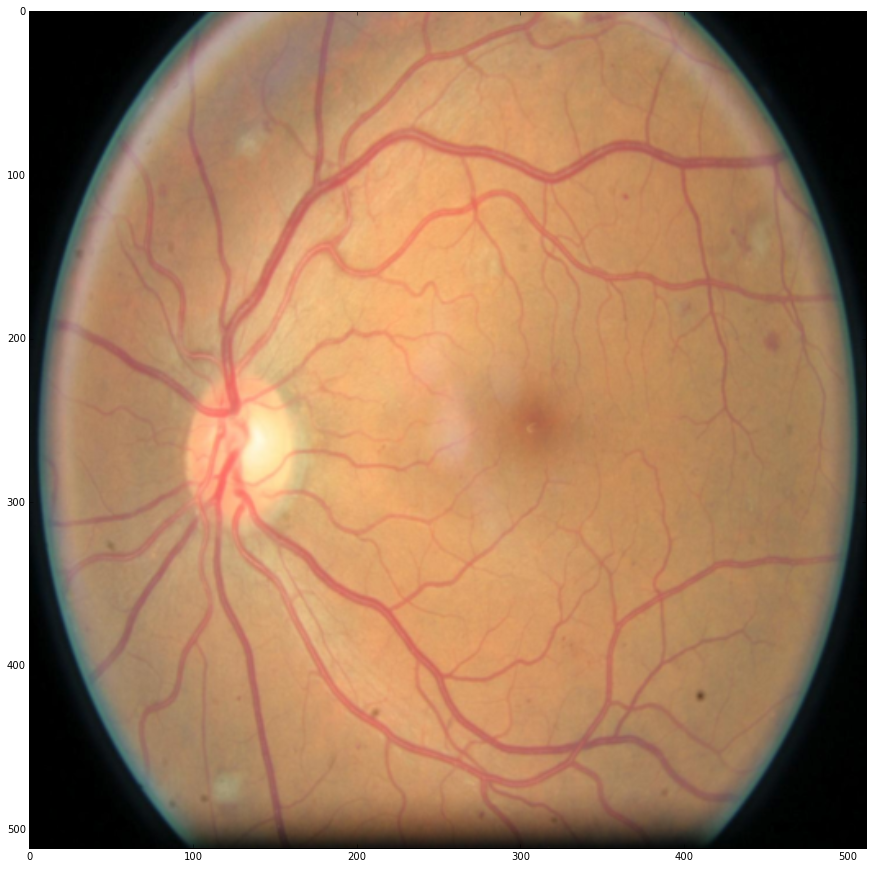

In [48]:
plot_rollaxis(diag_result[0][2*idx+0])  # Left.
plot_rollaxis(diag_result[0][2*idx+1])  # Right.

Notice **the camera artifacts**!

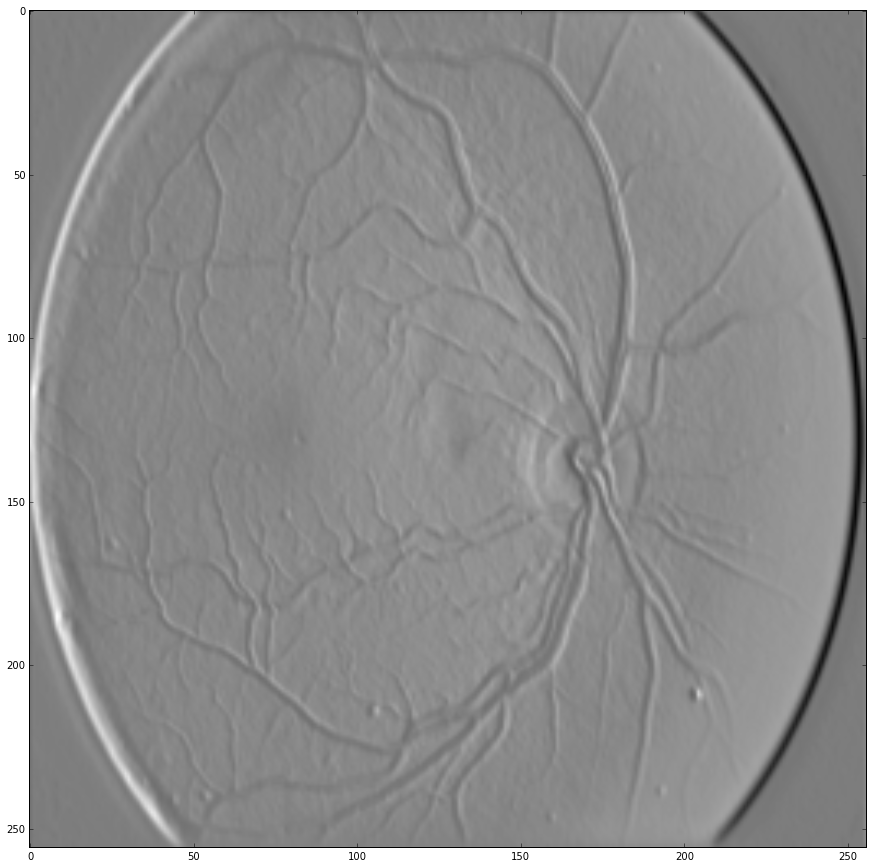

In [49]:
fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(diag_result[1][2*idx+0][10], cmap=plt.cm.gray)

(32, 127, 127)
(32, 127, 127)


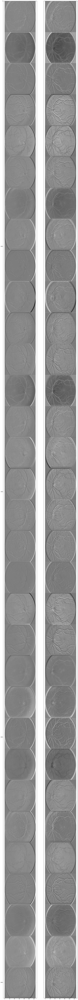

In [50]:
print_output(diag_result[3][2*idx:], norm=False)